# Title of notebook

Brief 1-2 sentence description of notebook.

In [36]:
import warnings
warnings.filterwarnings('ignore')

In [37]:
import os
import glob
from collections import defaultdict
import re

In [38]:
os.environ["SPECTRAL_CONNECTIVITY_ENABLE_GPU"] = "true"
import cupy as cp

In [42]:
# Imports of all used packages and libraries
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from scipy import stats
import itertools
from scipy.stats import linregress

In [40]:
import spikeinterface.extractors as se
import spikeinterface.preprocessing as sp
from spectral_connectivity import Multitaper, Connectivity
import spectral_connectivity

## Inputs & Data

Explanation of each input and where it comes from.

In [2]:
# Inputs and Required data loading
# input varaible names are in all caps snake case
# Whenever an input changes or is used for processing 
# the vairables are all lower in snake case
OUTPUT_DIR = r"./proc" # where data is saved should always be shown in the inputs

In [4]:
BASELINE_OUTCOME_TO_COLOR = {'lose': "red",
 'omission': "orange",
 'rewarded': "green",
 'win': "blue"}

In [45]:
GROUPING = "trial_outcome"

In [15]:
ALL_BANDS = ["theta", "beta", "gamma"]
BAND_TO_FREQ = {"theta": {"low_freq": 4, "high_freq": 12}, "beta": {"low_freq": 13, "high_freq": 30}, "gamma": {"low_freq": 30, "high_freq": 70}}

## Outputs

Describe each output that the notebook creates. 

- Is it a plot or is it data?

- How valuable is the output and why is it valuable or useful?

## Functions 

In [29]:
def generate_pairs(lst):
    pairs = []
    n = len(lst)
    for i in range(n):
        for j in range(i+1, n):
            pairs.append((lst[i], lst[j]))
    return pairs

In [30]:
def nested_dict():
    return defaultdict(dict)

triple_nested_dict = defaultdict(nested_dict)

## Processing

Describe what is done to the data here and how inputs are manipulated to generate outputs. 

In [3]:
# As much code and as many cells as required
# includes EDA and playing with data
# GO HAM!

# Ideally functions are defined here first and then data is processed using the functions

# function names are short and in snake case all lowercase
# a function name should be unique but does not have to describe the function
# doc strings describe functions not function names




In [7]:
BASIC_LFP_POWER_DF = pd.read_pickle("./proc/rce_standard_lfp_power.pkl")

In [10]:
BASIC_LFP_POWER_DF = BASIC_LFP_POWER_DF.drop(columns=[col for col in BASIC_LFP_POWER_DF.columns if "baseline" in col], errors="igopre")

In [11]:
BASIC_LFP_POWER_DF

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,mPFC_trial_split_window_power,vHPC_trial_split_window_power,BLA_trial_split_window_power,LH_trial_split_window_power,MD_trial_split_window_power,mPFC_trial_window_mean_power,vHPC_trial_window_mean_power,BLA_trial_window_mean_power,LH_trial_window_mean_power,MD_trial_window_mean_power
0,6310663,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,1390826,20221202_134600_omission_and_competition_subje...,1734,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[[0.01696672303781108, 0.03178479059744388, 0....","[[4.005538323005687e-05, 0.0018044630335189537...","[[0.04491290952533168, 0.02270857798223664, 0....","[[0.031695051047594014, 0.051937955975557455, ...","[[0.032833501435380816, 0.04709418500227714, 0...","[0.011109052303837802, 0.013703772974504588, 0...","[0.010929213986019643, 0.014804551333771634, 0...","[0.013021336208598796, 0.01078749578488009, 0....","[0.0193710151951909, 0.02740101877547173, 0.03...","[0.0194043826551789, 0.026520127923309284, 0.0..."
1,7910662,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,2990825,20221202_134600_omission_and_competition_subje...,3728,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[[0.0037334787411261007, 0.0035153710405479797...","[[0.00323424700043022, 0.019898029408763784, 0...","[[0.005716602962697906, 0.003943970047390704, ...","[[0.038297251959030734, 0.021651589308400502, ...","[[0.010056549914332257, 0.01143885094953029, 0...","[0.007743783642212699, 0.008059036497600052, 0...","[0.016421771844326593, 0.019561709517479986, 0...","[0.008416970923840155, 0.009724840422270498, 0...","[0.01651023231192396, 0.018066108785564205, 0....","[0.00530899438524329, 0.0067875376164479055, 0..."
2,9710660,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,4790823,20221202_134600_omission_and_competition_subje...,5972,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[[0.012843656839471175, 0.01342800077278396, 0...","[[0.0007323275940454185, 0.009700632493720641,...","[[0.06933438987830287, 0.05697228832213598, 0....","[[0.00979755598181906, 0.014146400796171257, 0...","[[0.008679089652118497, 0.00999164999033577, 0...","[0.0067922271760090264, 0.009311724076998767, ...","[0.03339536433707833, 0.0340600736371894, 0.04...","[0.01104377418743839, 0.013212310250049845, 0....","[0.0117156419412432, 0.018041661035510834, 0.0...","[0.006070764808087657, 0.010462125757377016, 0..."
3,11310658,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,6390821,20221202_134600_omission_and_competition_subje...,7966,1.0,6_1_top_2_base_3,omission,20221202_134600_omission_and_competition_subje...,...,"[[0.0007865044506117278, 0.003781282774596974,...","[[0.027755152062010735, 0.03712525955958855, 0...","[[0.022521901984191493, 0.029347392107097747, ...","[[0.0023960657750419206, 0.013855052061619928,...","[[0.002936095430642071, 0.007650194242857702, ...","[0.004390120320394263, 0.006917875842116777, 0...","[0.015061685449078321, 0.01797201604281875, 0....","[0.007334036310029185, 0.009985683613716885, 0...","[0.006958200495775015, 0.0109644905764703, 0.0...","[0.006694792673895167, 0.008035983579479915, 0..."
4,12810657,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,7890820,20221202_134600_omission_and_competition_subje...,9836,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,"[[0.005147748981524292, 0.004062568677324185, ...","[[0.014714661575518831, 0.01142624129889748, 0...","[[0.01059652343025121, 0.011396560061484479, 0...","[[0.009301842305293587, 0.007158964208244392, ...","[

## Calculating average power per band

In [12]:
mean_power_columns = [col for col in BASIC_LFP_POWER_DF.columns if "window_mean_power" in col]

In [13]:
mean_power_columns

['mPFC_trial_window_mean_power',
 'vHPC_trial_window_mean_power',
 'BLA_trial_window_mean_power',
 'LH_trial_window_mean_power',
 'MD_trial_window_mean_power']

- Averaging the powers for each band

In [16]:
ALL_BANDS

['theta', 'beta', 'gamma']

In [17]:
BAND_TO_FREQ

{'theta': {'low_freq': 4, 'high_freq': 12},
 'beta': {'low_freq': 13, 'high_freq': 30},
 'gamma': {'low_freq': 30, 'high_freq': 70}}

In [76]:
for region in mean_power_columns:    
    region_base_name = "{}".format(region.split("_")[0].strip("_"))
    print(region_base_name)
    for band in ALL_BANDS:
        print(band)
        
        BASIC_LFP_POWER_DF["{}_averaged_{}_power".format(region_base_name, band)] = BASIC_LFP_POWER_DF["{}_trial_window_mean_power".format(region_base_name)].apply(lambda x: x[BAND_TO_FREQ[band]["low_freq"]:BAND_TO_FREQ[band]["high_freq"]+1])
        # print(BASIC_LFP_POWER_DF["{}_averaged_{}_power".format(region_base_name, band)].head())

        


mPFC
theta
beta
gamma
vHPC
theta
beta
gamma
BLA
theta
beta
gamma
LH
theta
beta
gamma
MD
theta
beta
gamma


In [77]:
BASIC_LFP_POWER_DF["LH_averaged_beta_power"]

0      [0.004166535437828509, 0.004497933273198284, 0...
1      [0.0076715756694397145, 0.007487124062845352, ...
2      [0.004927528746214436, 0.0048546588168934925, ...
3      [0.0060814931107377995, 0.005333270517782906, ...
4      [0.009171519265053534, 0.007813455924553063, 0...
                             ...                        
538    [0.006470460053810802, 0.005896691927238751, 0...
539    [0.006960425717369536, 0.007533041615895496, 0...
540    [0.005731098084275249, 0.005886376368340429, 0...
541    [0.01151807338445067, 0.012646868375744112, 0....
542    [0.005086961068608472, 0.006685614818514538, 0...
Name: LH_averaged_beta_power, Length: 391, dtype: object

In [78]:
for region in mean_power_columns:    
    region_base_name = "{}".format(region.split("_")[0].strip("_"))
    print(region_base_name)
    for band in ALL_BANDS:
        print(band)
        
        BASIC_LFP_POWER_DF["{}_averaged_{}_power".format(region_base_name, band)] = BASIC_LFP_POWER_DF["{}_trial_window_mean_power".format(region_base_name)].apply(lambda x: np.nanmean(x[BAND_TO_FREQ[band]["low_freq"]:BAND_TO_FREQ[band]["high_freq"]+1]))
        # print(BASIC_LFP_POWER_DF["{}_averaged_{}_power".format(region_base_name, band)].head())

        


mPFC
theta
beta
gamma
vHPC
theta
beta
gamma
BLA
theta
beta
gamma
LH
theta
beta
gamma
MD
theta
beta
gamma


In [79]:
BASIC_LFP_POWER_DF

,time,recording_dir,recording_file,time_stamp_index,video_file,video_frame,video_number,subject_info,competition_closeness,video_name,...,vHPC_averaged_gamma_power,BLA_averaged_theta_power,BLA_averaged_beta_power,BLA_averaged_gamma_power,LH_averaged_theta_power,LH_averaged_beta_power,LH_averaged_gamma_power,MD_averaged_theta_power,MD_averaged_beta_power,MD_averaged_gamma_power
0,6310663,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,1390826,20221202_134600_omission_and_competition_subje...,1734,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,0.001730,0.016238,0.004407,0.002808,0.028031,0.003177,0.000881,0.037614,0.002914,0.000763
1,7910662,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,2990825,20221202_134600_omission_and_competition_subje...,3728,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,0.001243,0.018155,0.006503,0.001912,0.026641,0.003807,0.000880,0.025737,0.002945,0.000659
2,9710660,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,4790823,20221202_134600_omission_and_competition_subje...,5972,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,0.001449,0.016286,0.005668,0.002459,0.026303,0.003061,0.000849,0.032700,0.002836,0.000720
3,11310658,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,6390821,20221202_134600_omission_and_competition_subje...,7966,1.0,6_1_top_2_base_3,omission,20221202_134600_omission_and_competition_subje...,...,0.001337,0.020616,0.004404,0.002287,0.032039,0.002903,0.000983,0.028340,0.002255,0.000727
4,12810657,20221202_134600_omission_and_competition_subje...,20221202_134600_omission_and_competition_subje...,7890820,20221202_134600_omission_and_competition_subje...,9836,1.0,6_1_top_2_base_3,rewarded,20221202_134600_omission_and_competition_subje...,...,0.001116,0.024152,0.005986,0.002193,0.027986,0.003560,0.000866,0.030557,0.003097,0.000698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,65281838,20230621_111240_standard_comp_to_omission_D5_s...,20230621_111240_standard_comp_to_omission_D5_s...,62088794,20230621_111240_standard_comp_to_omission_D5_s...,62056,1.0,1-4_t3b3L_box1,rewarded,20230621_111240_standard_comp_to_omission_D5_s...,...,0.002122,0.017736,0.003885,0.004111,0.022325,0.003704,0.001044,0.022419,0.003770,0.001052
539,66781856,20230621_111240_standard_comp_to_omission_D5_s...,20230621_111240_standard_comp_to_omission_D5_s...,63588812,20230621_111240_standard_comp_to_omission_D5_s...,63554,1.0,1-4_t3b3L_box1,rewarded,20230621_111240_standard_comp_to_omission_D5_s...,...,0.002376,0.019834,0.004225,0.003655,0.028594,0.004243,0.001316,0.030841,0.004172,0.001306
540,68781880,20230621_111240_standard_comp_to_omission_D5_s...,20230621_111240_standard_comp_to_omission_D5_s...,65588836,20230621_111240_standard_comp_to_omission_D5_s...,65550,1.0,1-4_t3b3L_box1,rewarded,20230621_111240_standard_comp_to_omission_D5_s...,...,0.002500,0.020002,0.003443,0.003949,0.026309,0.003608,0.001321,0.027710,0.003702,0.001312
541,70681909,20230621_111240_standard_comp_to_omission_D5_s...,20230621_111240_standard_comp_to_omission_D5_s...,67488865,20230621_111240_standard_comp_to_omission_D5_s...,67447,1.0,1-4_t3b3L_box1,omission,20230621_111240_standard_comp_to_omission_D5_s...,...,0.002153,0.016689,0.004462,0.003837,0.033249,0.005101,0.001183,0.033702,0.005064,0.001138


In [84]:
band_to_power_correlation = defaultdict(dict)
for band in ALL_BANDS:
    averaged_columns = [col for col in BASIC_LFP_POWER_DF.columns if "averaged_{}".format(band) in col]
    band_to_power_correlation[band]["brain_region_pairs"] = sorted(generate_pairs(sorted(averaged_columns)))

    # Removing rows that are outliers
    filtered_df = BASIC_LFP_POWER_DF.copy()
    for col in averaged_columns:
        # Assuming data is a 1D numpy array
        threshold = 2
        mean = np.mean(filtered_df[col])
        std = np.std(filtered_df[col])
        filtered_df = filtered_df[np.abs(filtered_df[col] - mean) < threshold * std]
    band_to_power_correlation[band]["outlier_removed_df"] = filtered_df

In [85]:
BASIC_LFP_POWER_DF.shape

(391, 69)

In [86]:
band_to_power_correlation[band]["outlier_removed_df"].shape

(338, 69)

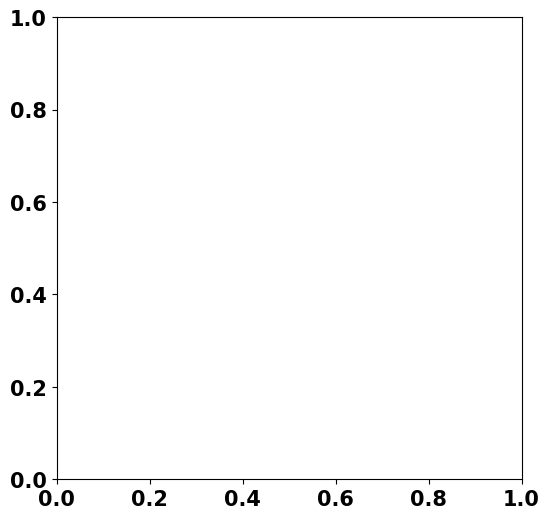

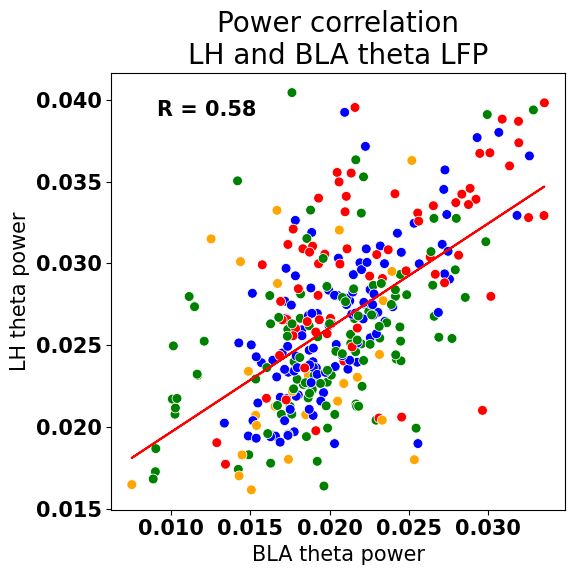

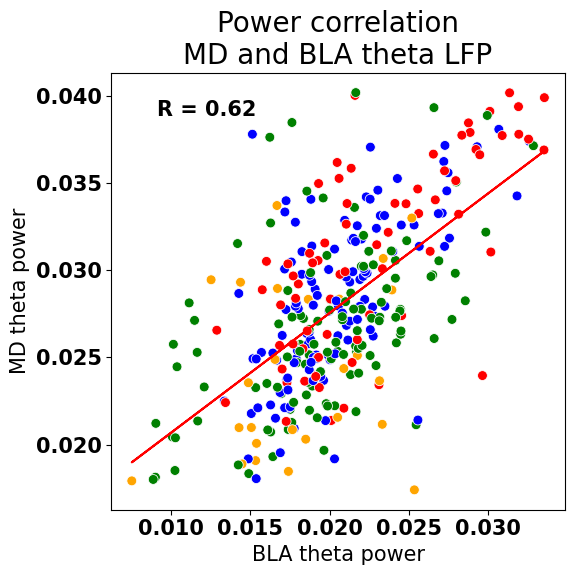

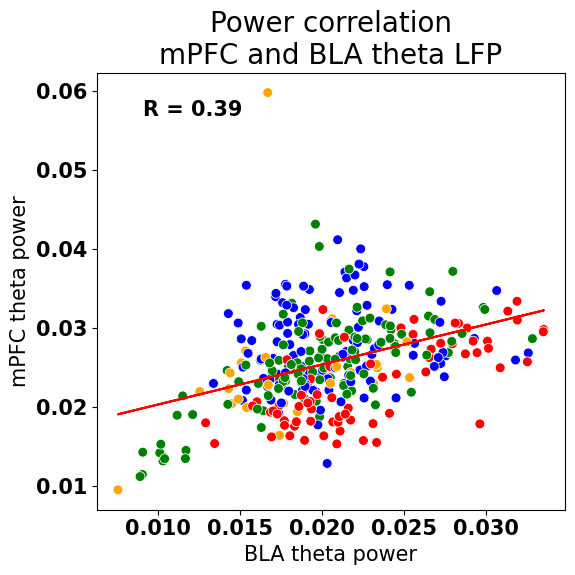

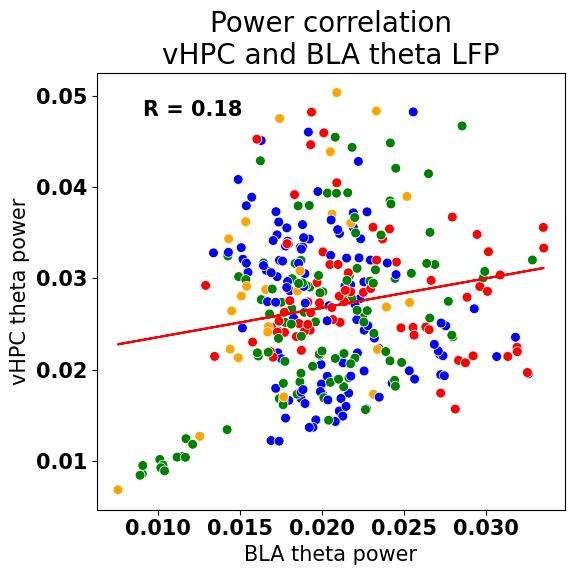

...

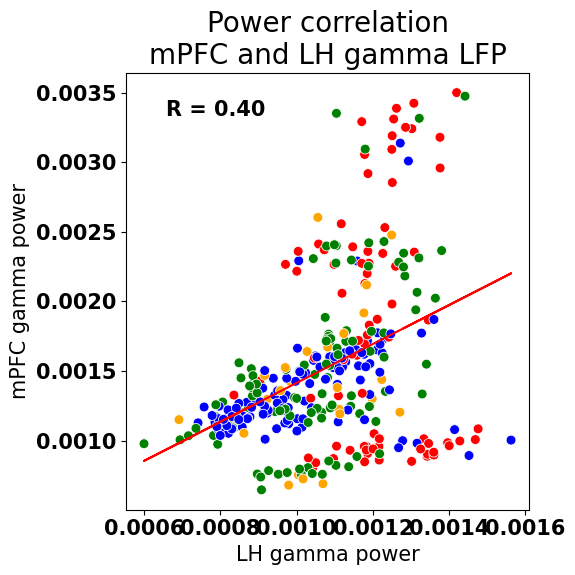

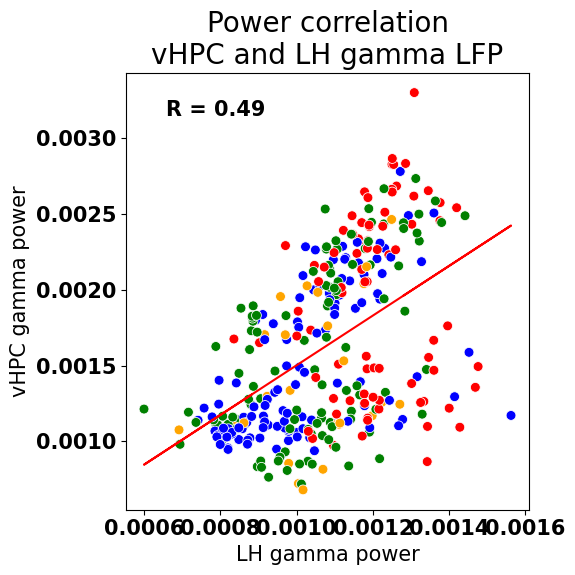

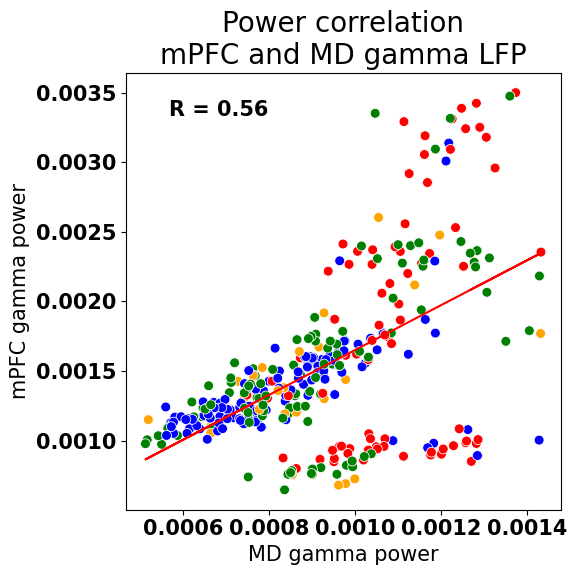

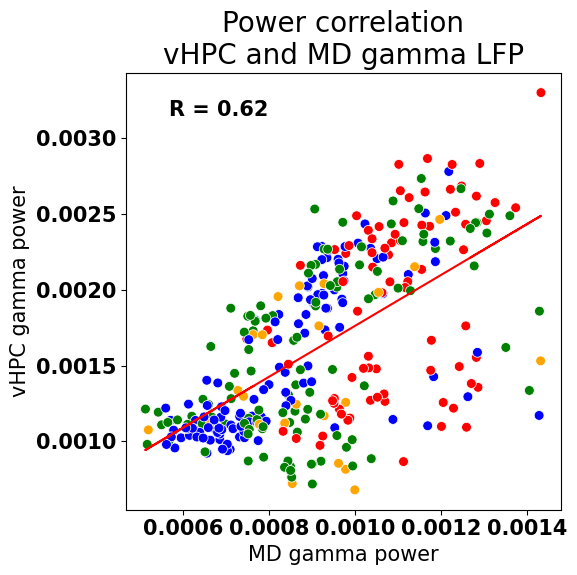

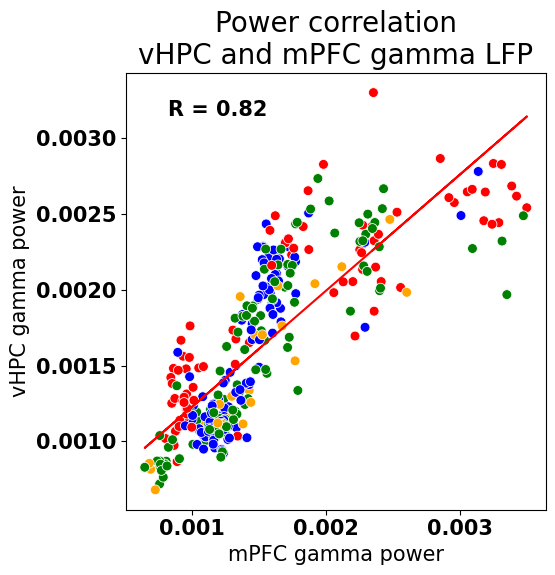

In [87]:
font = {'weight' : 'bold',
        'size'   : 15}

matplotlib.rc('font', **font)

plt.rcParams['figure.figsize'] = [6, 6]
for band in ALL_BANDS:
    for region_1, region_2 in band_to_power_correlation[band]["brain_region_pairs"]:
        fig, ax = plt.subplots()
        plt.rcParams['figure.figsize'] = [6, 6]

        
        region_1_basename = region_1.split("_")[0]
        region_2_basename = region_2.split("_")[0]
        x = band_to_power_correlation[band]["outlier_removed_df"][region_1]
        y = band_to_power_correlation[band]["outlier_removed_df"][region_2]
        
        # Perform linear regression to get the slope, intercept and r-value (correlation coefficient)
        slope, intercept, r_value, p_value, std_err = linregress(x, y)
        
        # Create a line of best fit using the slope and intercept
        line = slope * x + intercept
        
        # Create scatter plot
        sns.scatterplot(x=x, y=y, data=band_to_power_correlation[band]["outlier_removed_df"], hue='trial_outcome', palette=BASELINE_OUTCOME_TO_COLOR, s=50)
        
        # Plot line of best fit
        plt.plot(x, line, color='red')
        
        # Add R² value to the plot
        plt.text(0.1, 0.9, f'R = {r_value:.2f}', transform=plt.gca().transAxes)
        
        # Add labels and legend
        plt.title("Power correlation\n{} and {} {} LFP".format(region_2_basename, region_1_basename, band), fontsize=20)
        plt.xlabel('{} {} power'.format(region_1_basename, band))
        plt.ylabel('{} {} power'.format(region_2_basename, band))
        # plt.legend(loc="lower right")
        ax.get_legend().remove()
        plt.tight_layout()
        # plt.savefig("./proc/power_correlation/all_condition_{}_{}_power_correlation_of_zscored_{}_lfp.png".format(region_1_basename, region_2_basename, band))
        # Display the plot
        plt.show()




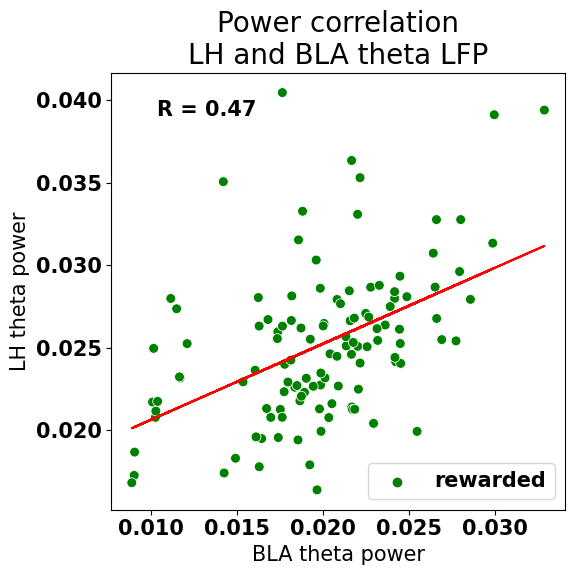

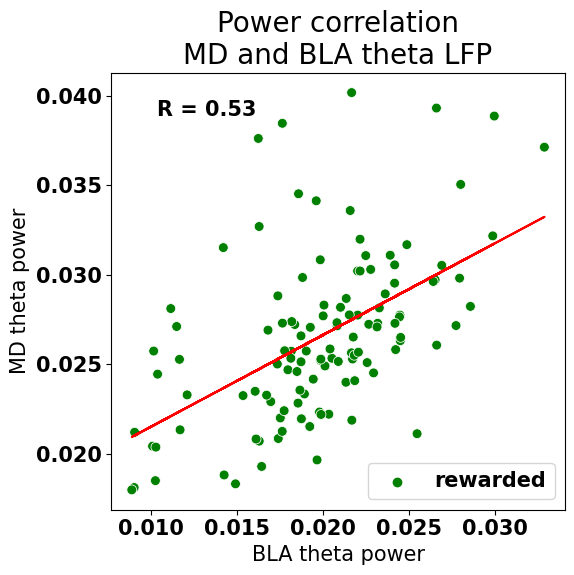

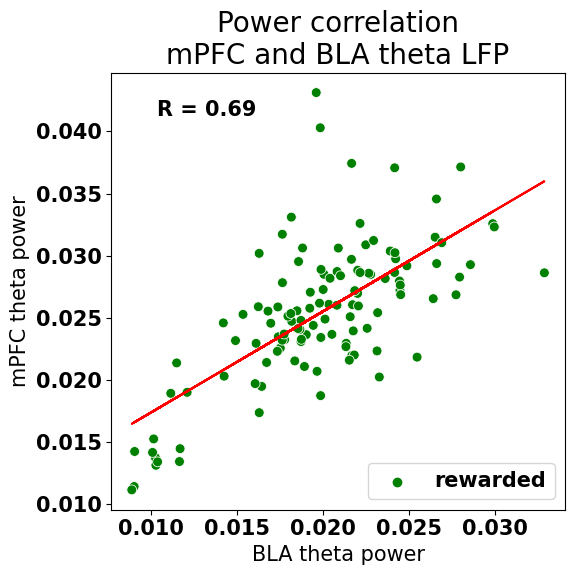

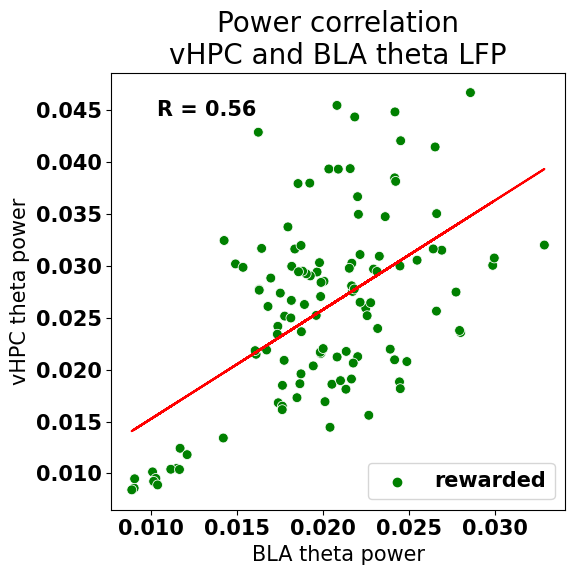

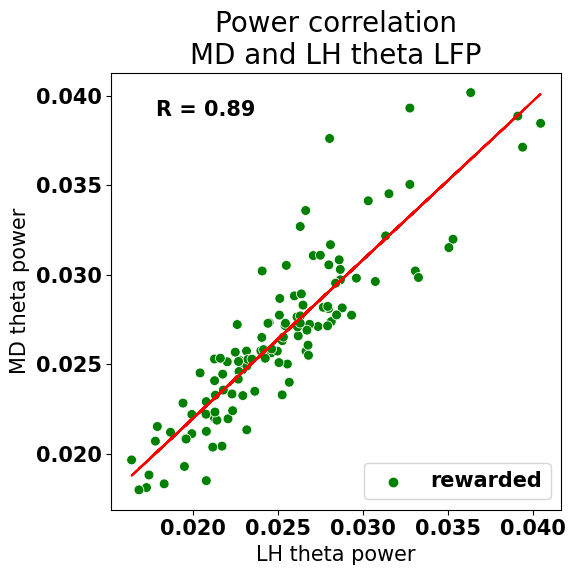

...

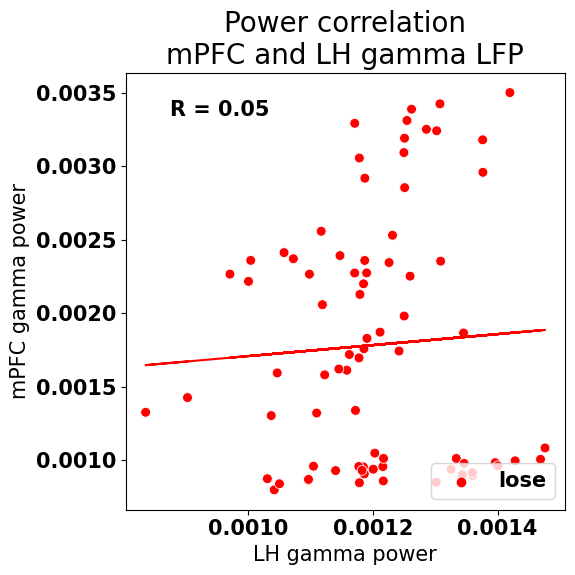

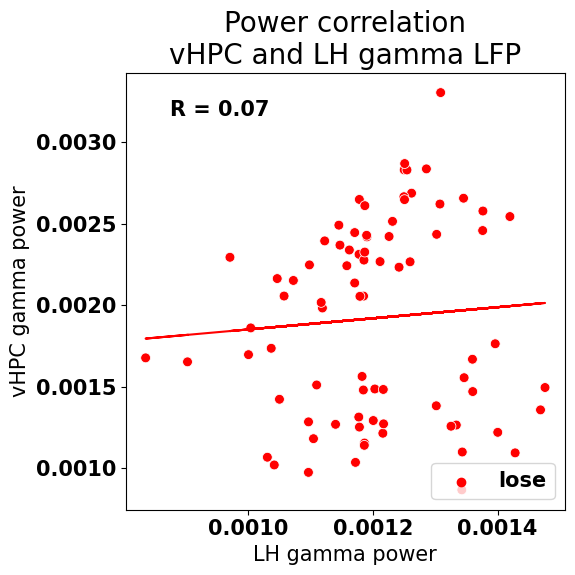

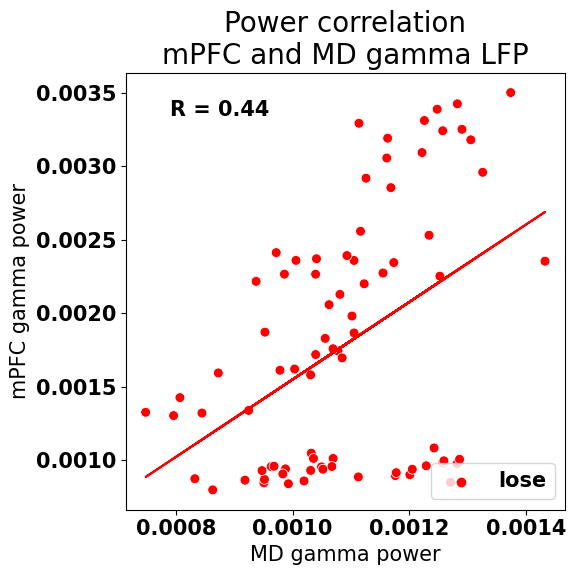

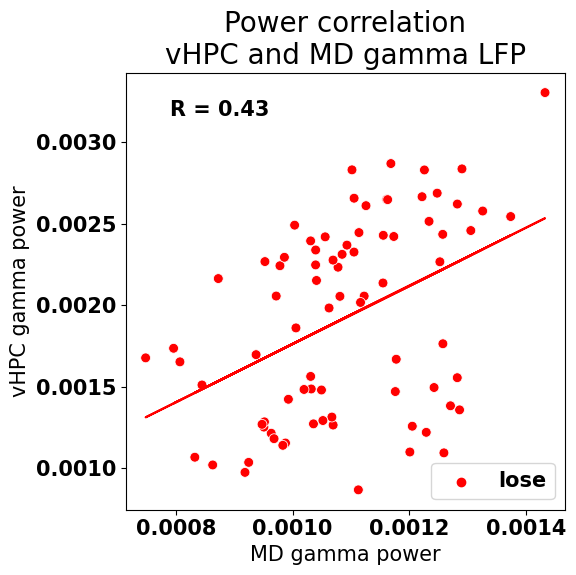

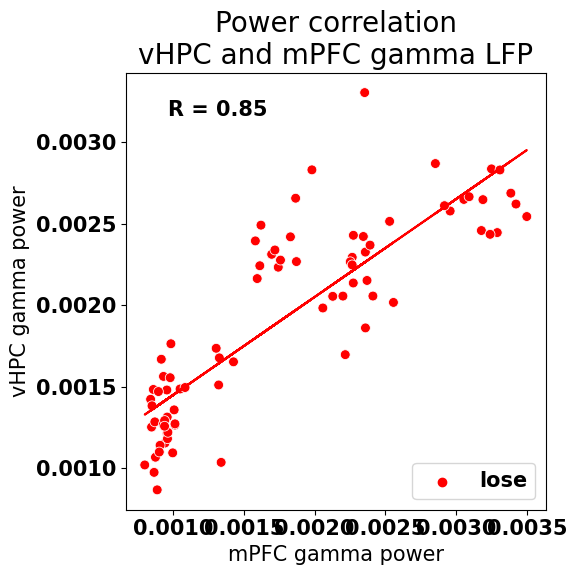

In [88]:
font = {'weight' : 'bold',
        'size'   : 15}

matplotlib.rc('font', **font)

plt.rcParams['figure.figsize'] = [6, 6]
for band in ALL_BANDS:
    band_df = band_to_power_correlation[band]["outlier_removed_df"]
    band_to_power_correlation[band]["region_pair_to_outcome_to_r2"] = defaultdict(nested_dict)
    for outcome in band_df["trial_outcome"].unique():
        outcome_df = band_df[band_df["trial_outcome"] == outcome]
        for region_1, region_2 in band_to_power_correlation[band]["brain_region_pairs"]:
            plt.rcParams['figure.figsize'] = [6, 6]

            region_1_basename = region_1.split("_")[0]
            region_2_basename = region_2.split("_")[0]
            
            x = outcome_df[region_1]
            y = outcome_df[region_2]
            
            # Perform linear regression to get the slope, intercept and r-value (correlation coefficient)
            slope, intercept, r_value, p_value, std_err = linregress(x, y)
            # Square the r value to get the r squared value
            r2_value = r_value**2
            band_to_power_correlation[band]["region_pair_to_outcome_to_r2"]["{}_{}".format(region_1.split("_")[0], region_2.split("_")[0])][outcome]["r"] = r_value
            band_to_power_correlation[band]["region_pair_to_outcome_to_r2"]["{}_{}".format(region_1.split("_")[0], region_2.split("_")[0])][outcome]["std"] = std_err
            
            # Create a line of best fit using the slope and intercept
            line = slope * x + intercept
            
            # Create scatter plot
            sns.scatterplot(x=x, y=y, data=outcome_df, hue='trial_outcome', palette=BASELINE_OUTCOME_TO_COLOR, s=50)
            
            # Plot line of best fit
            plt.plot(x, line, color='red')
            
            # Add R² value to the plot
            plt.text(0.1, 0.9, f'R = {r_value:.2f}', transform=plt.gca().transAxes)
            
            # Add labels and legend
            plt.title("Power correlation\n{} and {} {} LFP".format(region_2_basename, region_1_basename, band), fontsize=20)
            plt.xlabel('{} {} power'.format(region_1_basename, band))
            plt.ylabel('{} {} power'.format(region_2_basename, band))
            plt.legend(loc="lower right")
            plt.tight_layout()
            # plt.savefig("./proc/power_correlation/{}/{}_{}_{}_{}_{}_power_correlation_of_zscored_lfp.png".format(GROUPING, GROUPING, band, outcome, region_1_basename, region_2_basename, band))
            # Display the plot
            plt.show()

In [89]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)

In [90]:
font = {'weight' : 'bold',
        'size'   : 12}

matplotlib.rc('font', **font)

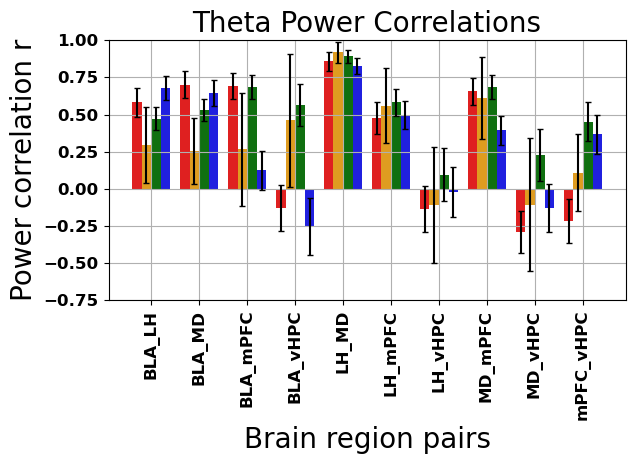

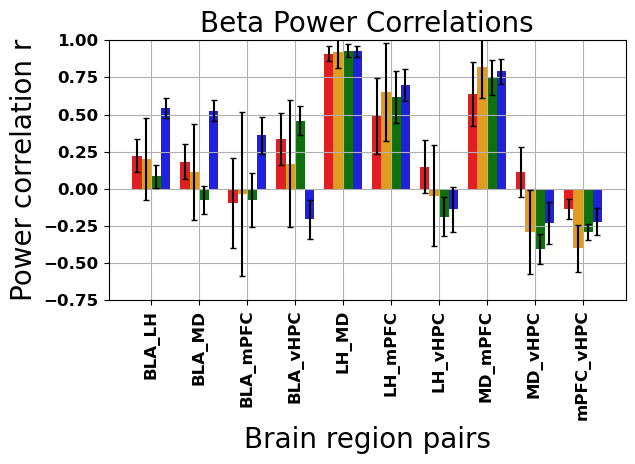

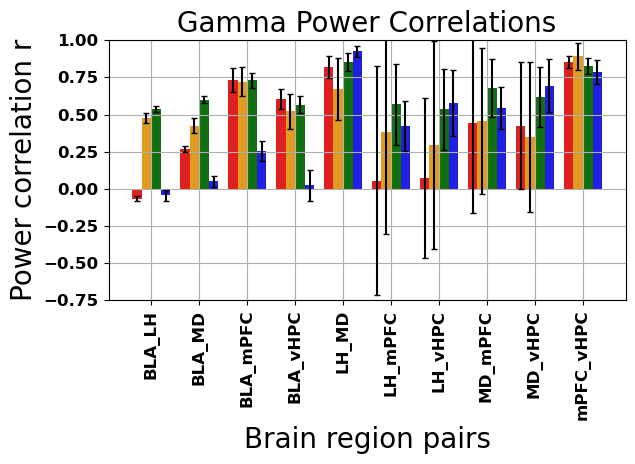

In [91]:
for band in ALL_BANDS:
    fig, ax = plt.subplots()

    # Convert the nested dictionary to a DataFrame
    data = []
    for group_name, group_data in band_to_power_correlation[band]['region_pair_to_outcome_to_r2'].items():
        for bar_name, bar_dict in sorted(group_data.items()):
            data.append({"Group": group_name, "Bar": bar_name, "r": bar_dict["r"], "std": bar_dict["std"]})
            
    df = pd.DataFrame(data)
    df["color"] = df["Bar"].map(BASELINE_OUTCOME_TO_COLOR)
    # Create the bar plot using seaborn
    # sns.catplot(
    #     data=df, 
    #     x='Group', 
    #     y='r2', 
    #     hue='Bar', 
    #     kind='bar', 
    #     height=4, 
    #     aspect=2,
    #     legend=False,
    #     # yerr=df['std'].values,  # This line adds the SEM bars
    #     # capsize=0.1  # This line adds caps on the error bars
    # )
    
    # Create barplot
    ax = sns.barplot(x='Group', y='r', hue='Bar', data=df, ci=None, palette=df["color"])
    
    # Adding error bars
    groups = df['Group'].unique()
    bars_per_group = df['Bar'].nunique()
    bar_width = 0.8 / bars_per_group
    x_positions = []
    
    for i, group in enumerate(groups):
        num_bars = df[df['Group'] == group].shape[0]
        group_positions = np.linspace(i - bar_width*(num_bars-1)/2, i + bar_width*(num_bars-1)/2, num_bars)
        x_positions.extend(group_positions)
    
    for i, (r2, sem) in enumerate(zip(df['r'], df['std'])):
        plt.errorbar(x_positions[i], r2, yerr=sem, fmt='none', color='black', capsize=2)
    
    
    plt.xticks(rotation=90)
    plt.xlabel("Brain region pairs", fontsize=20)
    plt.ylabel("Power correlation r", fontsize=20)
    plt.title("{} Power correlations".format(band).title(), fontsize=20)
    # plt.tight_layout()
    plt.grid()
    plt.ylim(-0.75,1)
    plt.tight_layout()
    # plt.legend(title="Trial Conditions", ncol=4, loc="upper left")
    ax.get_legend().remove()
    
    plt.savefig("./proc/power_correlation/{}_zscored_{}_lfp_power_correlation.png".format(GROUPING, band))
    # Show the plot
    plt.show()